In [1]:
%matplotlib widget
import matplotlib.pyplot as plt
import numpy as np
import ipywidgets
from pathlib import Path
import pandas as pd
import collections
from scipy.stats import binned_statistic_2d
from functions import *
import os
import sys

In [2]:
output_folder = Path.cwd()/"output_plots"

if not os.path.exists(output_folder):
    os.makedirs(output_folder)

# Import and read the dataframe from cn04 

In [3]:
filename = "pkl_files/data_2023_05_13_to_2023_07_02.pkl"
data_file = Path(filename)

all_data = pd.read_pickle(data_file)

In [4]:
def plot_function(data_to_plot, title):
    
    def plotimg(idx):
        # Update histogram
        ax[0].clear()
        ax[0].hist(data_to_plot[int(idx)].flatten(), bins = len(np.unique(data_to_plot[int(idx)].flatten())))
        # Update image
        img.set_data(data_to_plot[int(idx),:,:])
        im = ax[1].imshow(data_to_plot[int(idx),:,:], origin='lower', cmap = 'viridis')
        ax[0].axvline(np.nanmedian(data_to_plot[int(idx),:,:]), c = 'r',  alpha = 0.5) # median pixel value
        ax[0].axvline(np.nanmean(data_to_plot[int(idx),:,:]), c = 'g', alpha = 0.5) # mean pixel value
        #plt.colorbar(im)
        fig.canvas.draw_idle()
        
    fig, ax = plt.subplots(ncols = 2, figsize=(12,4))
    img = ax[1].imshow(data_to_plot[0], origin='lower')
    #colorbar = plt.colorbar(img)
    ax[0].set_xlabel('Brightness')
    ax[0].set_ylabel('Nb of pixels')
    plt.suptitle(title, weight = 'bold')

    ipywidgets.interact(plotimg, idx = ipywidgets.FloatSlider(value=0,min=0,max=np.shape(data_to_plot)[0]-1,step=1))
    plt.show()
    
def apply_filters(data, filter_names, values, reverse_filters):
    
    # Available filters ['latitude-','latitude+','visit','density_cosmics','nb_cosmics','no_straylight','largest_cosmics']
    list_filter_names = ['time-','time+','latitude-','latitude+','visit','density_cosmics','nb_cosmics','no_straylight','largest_cosmics']
    
    filtered_data = data.copy()
    
    for filter_name, value, reverse in zip(filter_names,values, reverse_filters): 
        
        if reverse:
            inf = '>'
            sup = '<'
        else: 
            inf = '<'
            sup = '>'
            
        if filter_name == 'time-':
            print(f"Keep data {sup} {value}")
            filter_to_apply = filtered_data['time'] >= value
        elif filter_name == 'time+':
            print(f"Keep data {inf} {value}")
            filter_to_apply = filtered_data['time'] <= value
        elif filter_name == 'latitude-':
            print(f"Kepp data with latitude {sup} {value}")
            filter_to_apply = filtered_data['LATITUDE'] > value
        elif filter_name == 'latitude+':
            print(f"Keep with latitude {inf} {value}")
            filter_to_apply = filtered_data['LATITUDE'] < value  
        elif filter_name == 'visit':
            print(f"Keep data only from {value}")
            filter_to_apply = filtered_data['visit_ID'] == value
        elif filter_name == 'density_cosmics':
            print(f"Keep data only with a density of cosmics {sup} {value}")
            filter_to_apply = filtered_data['density_cosmics'] > value        
        elif filter_name == 'nb_cosmics':
            print(f"Keep data only with a number of cosmics {sup} {value}")
            filter_to_apply = filtered_data['nb_cosmics'] > value        
        elif filter_name == 'no_straylight':
            if reverse:
                print(f"Keep data only affected with straylight")
            else:
                print(f"Keep data only not affected with straylight")
            filter_to_apply = filtered_data['straylight_boolean']
            filter_to_apply = ~filter_to_apply
        elif filter_name == 'largest_cosmics':
            print(f"Keep data only with a largest cosmic {inf} {value}")
            filter_to_apply = filtered_data['largest_cosmics'] < value
        else:
            print(f"Filter_name not in {list_filter_names}")   
            
        # apply filter 
        if reverse:
            filter_to_apply = ~filter_to_apply

        nb_points = len(filtered_data)
        filtered_data = filtered_data[filter_to_apply]
        nb_datapoints_remomoved =  nb_points - len(filtered_data)
        print(f"Removed {nb_datapoints_remomoved} data points, kept {len(filtered_data)}")
        
    return filtered_data

# Detections

In [5]:
if len(np.unique(all_data['im_height'])) > 1:
    diff_image_types = True # We have different image sizes in all_data
    print(f"Sizes available are {np.unique(all_data['im_height'])}")
else:
    diff_image_types = False

## Filter images

In [6]:
# DETECTIONS 
detections = all_data[all_data['nb_cosmics'] != 0]
#detections = all_data[(all_data['density_cosmics'] < 60) & (all_data['density_cosmics'] > 40)]
non_detections = all_data[all_data['nb_cosmics'] == 0]

max_cosmics = np.max(detections['nb_cosmics'])
max_density = np.max(detections['density_cosmics'])

print(f'Frame with most cosmics has {max_cosmics} cosmics. largest density is {int(max_density)} hits/cm2/sec')
print(f"{int(len(detections)/len(all_data)*100)}% of visits ({len(detections)}/{len(all_data)}) have detections. {int(len(non_detections))} non detections\n")

# separate different images sizes
if diff_image_types:
    size_to_keep = 200
    detections_plot = detections[detections['im_height'] == size_to_keep]
    non_detections_plot = non_detections[non_detections['im_height'] == size_to_keep]
    print(f"!! Only images of sizes {size_to_keep}*{size_to_keep} are shown !!\n")
else:     
    detections_plot = detections
    non_detections_plot = non_detections
    
## Add other filters 
# Available filters ['latitude-','latitude+','visit','density_cosmics','nb_cosmics','no_straylight','largest_cosmics']
filters = ['no_straylight','largest_cosmics']
values = [None, 100]
reverse_filters = [False, False]

detections_plot = apply_filters(detections_plot,filters,values,reverse_filters)
print("")
non_detections_plot = apply_filters(non_detections_plot,filters,values,reverse_filters)

Frame with most cosmics has 664 cosmics. largest density is 456 hits/cm2/sec
68% of visits (1567/2298) have detections. 731 non detections

Keep data only not affected with straylight
Removed 41 data points, kept 1526
Keep data only with a largest cosmic < 100
Removed 69 data points, kept 1457

Keep data only not affected with straylight
Removed 14 data points, kept 717
Keep data only with a largest cosmic < 100
Removed 0 data points, kept 717


In [14]:
data_to_plot1 = reshape_flatten_images('masked_images', detections_plot) 
# data_to_plot2 = reshape_flatten_images('binary_images', detections_plot) 
# data_to_plot3 = reshape_flatten_images('derotated_images', detections_plot) 
# data_to_plot3 = np.log(data_to_plot3+1)
visit_id = detections_plot['visit_ID'].values
stacking_order = detections_plot['n_exp'].values
image_counter = detections_plot['img_counter'].values
threshold_cosmics = detections_plot['threshold_cosmics'].values
cosmics = detections_plot['nb_cosmics'].values
density_cosmics = detections_plot['density_cosmics'].values
straylight_boolean = detections_plot['straylight_boolean'].values
largest_cosmics = detections_plot['largest_cosmics'].values
percentage_value = detections_plot['percentage_cosmics'].values

def plotimg(idx):
    
    # Update histogram
    ax[0].clear()
    ax[0].hist(data_to_plot1[int(idx)].flatten(), bins = 255)#int(np.max(data_to_plot1[int(idx)].flatten())))
    #ax[0].set_xlim(0,100)
    ax[0].set_ylim(0,2000)
    # Update image
    img1.set_data(data_to_plot1[int(idx)])
    # img2.set_data(data_to_plot2[int(idx)])
    # img3.set_data(data_to_plot3[int(idx)])
    ax[1].imshow(data_to_plot1[int(idx)], origin='lower', cmap = 'viridis')
    #ax[2].imshow(data_to_plot2[int(idx)], origin='lower', cmap = 'viridis')
    #ax[3].imshow(data_to_plot3[int(idx)], origin='lower', cmap = 'viridis')
    ax[0].axvline(threshold_cosmics[int(idx)], c = 'r',  alpha = 0.5) # median pixel value
    ax[0].text(0.25,0.9,f'{int(cosmics[int(idx)])} CRs detected: {np.round(density_cosmics[int(idx)],1)} CR/cm2/s', weight = 'bold', transform=ax[0].transAxes)
    fig.suptitle(f'DETECTIONS for visit {visit_id[int(idx)]}, image {image_counter[int(idx)]}, \n stacking order {stacking_order[int(idx)]}, straylight flag = {straylight_boolean[int(idx)]}, largest_cosmic = {largest_cosmics[int(idx)]} pixels', weight = 'bold')
    #plt.colorbar(im)
    fig.canvas.draw_idle()
    
fig, ax = plt.subplots(ncols = 2, figsize=(10,4))
img1 = ax[1].imshow(data_to_plot1[0], origin='lower')
# ax[1].set_title('Masked images')
# img2 = ax[2].imshow(data_to_plot2[0], origin='lower')
# ax[2].set_title('Detected cosmic rays')
# img3 = ax[3].imshow(data_to_plot3[0], origin='lower')
# ax[3].set_title('Derotated SubArray')
#colorbar = plt.colorbar(img)
ax[0].set_xlabel('Brightness')
ax[0].set_ylabel('Nb of pixels')

fig.suptitle(f"DETECTIONS for visit {visit_id[0]}, image {image_counter[0]}, \n stacking order {stacking_order[0]}", weight = 'bold')
ipywidgets.interact(plotimg, idx = ipywidgets.FloatSlider(value=0,min=0,max=np.shape(data_to_plot1)[0]-1,step=1))
plt.show()

KeyError: 'masked_images'

# Non detections

In [9]:
data_to_plot1 = reshape_flatten_images('masked_images', non_detections_plot) 
# data_to_plot2 = reshape_flatten_images('binary_images', non_detections_plot) 
# data_to_plot3 = reshape_flatten_images('derotated_images', non_detections_plot) 
# data_to_plot3 = np.log(data_to_plot3+1)
visit_id = non_detections_plot['visit_ID'].values
stacking_order = non_detections_plot['n_exp'].values
image_counter = non_detections_plot['img_counter'].values
threshold_cosmics = np.unique(non_detections_plot['threshold_cosmics'])
cosmics = non_detections_plot['nb_cosmics'].values
density_cosmics = non_detections_plot['density_cosmics'].values
straylight_boolean = non_detections_plot['straylight_boolean'].values
largest_cosmics = non_detections_plot['largest_cosmics'].values

def plotimg(idx):
    
    # Update histogram
    ax[0].clear()
    ax[0].hist(data_to_plot1[int(idx)].flatten(), bins = max(int(np.max(data_to_plot1[int(idx)].flatten())),1))
    ax[0].set_xlim(0,100)
    ax[0].set_ylim(0,5000)
    # Update image
    img1.set_data(data_to_plot1[int(idx)])
    # img2.set_data(data_to_plot2[int(idx)])
    # img3.set_data(data_to_plot3[int(idx)])
    ax[1].imshow(data_to_plot1[int(idx)], origin='lower', cmap = 'viridis')
    # ax[2].imshow(data_to_plot2[int(idx)], origin='lower', cmap = 'viridis')
    # ax[3].imshow(data_to_plot3[int(idx)], origin='lower', cmap = 'viridis')
    # ax[0].axvline(threshold_cosmics[int(idx)], c = 'r',  alpha = 0.5) # median pixel value
    ax[0].text(0.25,0.9,f'{int(cosmics[int(idx)])} CRs detected: {np.round(density_cosmics[int(idx)],1)} CR/cm2/s', weight = 'bold', transform=ax[0].transAxes)
    #plt.colorbar(im)    
    fig.suptitle(f'NON DETECTIONS for visit {visit_id[int(idx)]}, image {image_counter[int(idx)]}, stacking order {stacking_order[int(idx)]}, straylight flag = {straylight_boolean[int(idx)]}, largest_cosmic = {largest_cosmics[int(idx)]} pixels', weight = 'bold')
    fig.canvas.draw_idle()
    
fig, ax = plt.subplots(ncols = 2, figsize=(15,4))
img1 = ax[1].imshow(data_to_plot1[0], origin='lower')
ax[1].set_title('Masked imagettes')
# img2 = ax[2].imshow(data_to_plot2[0], origin='lower')
# ax[2].set_title('Detected cosmic rays')
# img3 = ax[3].imshow(data_to_plot3[0], origin='lower')
# ax[3].set_title('Derotated SubArray')
#colorbar = plt.colorbar(img)
ax[0].set_xlabel('Brightness')
ax[0].set_ylabel('Nb of pixels')

fig.suptitle(f'NON DETECTIONS for visit {visit_id[0]}, image {image_counter[0]}, stacking order {stacking_order[0]}', weight = 'bold')
ipywidgets.interact(plotimg, idx = ipywidgets.FloatSlider(value=0,min=0,max=np.shape(data_to_plot1)[0]-1,step=1))
plt.show()

KeyError: 'masked_images'

# Inspect latitude and longitude

In [10]:
# if type_of_visit == 'SAA':
#     resituted_orbit = pd.read_pickle('/Users/alexisheitzmann/Documents/CHEOPS/Code/SAA_monitoring_MC/restituted_orbit.pkl')
#     fig, ax = plt.subplots(ncols = 2, figsize=(12,4))
#     ax[0].plot(resituted_orbit.index,resituted_orbit['LATITUDE'], '.', label = 'restituted orbit')
#     ax[0].plot(detections.index,detections['LATITUDE'], '.', label = 'imagettes')
#     ax[0].set_title('LATITUDE')
#     ax[1].plot(resituted_orbit.index,resituted_orbit['LONGITUDE'], '.', label = 'restituted orbit')
#     ax[1].plot(detections.index,detections['LONGITUDE'], '.', label = 'imagettes')
#     ax[1].set_title('LONGITUDE')
# else:
#     print('science visits, no interpolation of orbit')

# MAP

In [15]:
import cartopy.crs as ccrs
import matplotlib
from matplotlib.colors import ListedColormap, LogNorm
import numpy as np


In [101]:
map_data = all_data.copy()

## APPLY FILTER TO DATA ##
# start_date = pd.Timestamp("2024-08-05 12:00:00", tz = 'UTC')
start_date = all_data.time.min()
#end_date = pd.Timestamp("2024-06-01 12:00:00", tz = 'UTC')
end_date = all_data.time.max()

# filters = ['time-','time+','no_straylight','largest_cosmics']
# values = [start_date, end_date, None, 100]
# reverse_filters = [False, False, False, False]
# map_data = apply_filters(map_data,filters,values,reverse_filters)

filters = ['no_straylight','largest_cosmics']
values = [None, 10000]
reverse_filters = [False, False]
map_data = apply_filters(map_data,filters,values,reverse_filters)

nb_visits = len(np.unique(all_data.visit_ID))
nb_SAA_visits = len(np.unique(all_data[all_data.visit_ID.str[:6] == '34_102'].visit_ID))

print(f"\nVisits go from {start_date.strftime('%d-%b-%Y')} to {end_date.strftime('%d-%b-%Y')}")
print(f"There are {nb_visits} in total, including {nb_SAA_visits} SAA visits")

data_plot = map_data


Keep data only not affected with straylight
Removed 55 data points, kept 2243
Keep data only with a largest cosmic < 10000
Removed 6 data points, kept 2237

Visits go from 13-May-2023 to 02-Jul-2023
There are 4 in total, including 0 SAA visits


In [102]:
# Read SAA mask
SAA_file = Path("ref_files") / "CH_TU2024-01-16T15-06-00_EXT_APP_SAAMap-690km_V0301.fits"

data_SAA = read_SAA_map(SAA_file)

# Bin and maks SAA mask contour
lon_min, lon_max = -180, 180
lat_min, lat_max = -90, 90

# Plot SAA mask
x = data_SAA['longitude']
y = data_SAA['latitude']
c = data_SAA['SAA_FLAG']

SAA_map_bins_lon = 4
SAA_map_bins_lat = 4
x_bins_SAA = np.arange(lon_min + SAA_map_bins_lon, lon_max,SAA_map_bins_lon)
y_bins_SAA = np.arange(lat_min + SAA_map_bins_lat, lat_max,SAA_map_bins_lat)

SAA_masked_binned = binned_statistic_2d(x, y, c, statistic='median', bins=[x_bins_SAA, y_bins_SAA]).statistic.T
lon, lat = np.meshgrid(x_bins_SAA, y_bins_SAA)

#cmap = ListedColormap(['none', 'white'])
#ax.imshow(ret_SAA.statistic.T, origin='lower', cmap = cmap, alpha = 0.7, extent=(lon_min, lon_max, lat_min, lat_max)) # Supported values for interplotation are 'none', 'antialiased', 'nearest', 'bilinear', 'bicubic', 'spline16', 'spline36', 'hanning', 'hamming', 'hermite', 'kaiser', 'quadric', 'catrom', 'gaussian', 'bessel', 'mitchell', 'sinc', 'lanczos', 'blackman'.


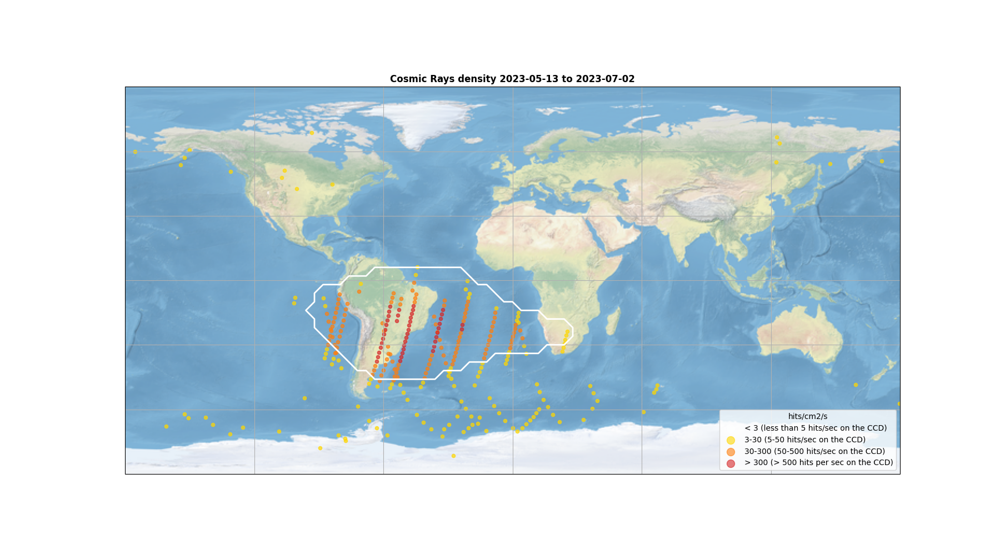

In [103]:
#%matplotlib widget
plt.close('all')
fig = plt.figure(figsize=(18, 10))
ax = plt.axes(projection=ccrs.PlateCarree())
#ax = plt.axes(projection=ccrs.Orthographic(0, -90))
ax.stock_img()
ax.gridlines()

plt.contour(lon[1:,1:], lat[1:,1:], SAA_masked_binned, colors = 'white', linewidths = 2, levels=[0], origin='lower', extent=(lon_min, lon_max, lat_min, lat_max),transform=ccrs.PlateCarree())

labels = ['< 3 (less than 5 hits/sec on the CCD) ','3-30 (5-50 hits/sec on the CCD) ','30-300 (50-500 hits/sec on the CCD) ', '> 300 (> 500 hits per sec on the CCD)']
colors = ['white','gold','C1','C3']
cm = ListedColormap(colors)
for i in range(4):
    if i == 0:
        continue
        x = data_plot.loc[data_plot['density_cosmics'] < 3]['LONGITUDE']
        y = data_plot.loc[data_plot['density_cosmics'] < 3]['LATITUDE']
        alpha = 0.5
        
    if i == 1:
        x = data_plot.loc[(data_plot['density_cosmics'] > 3) & (data_plot['density_cosmics'] < 30)]['LONGITUDE']
        y = data_plot.loc[(data_plot['density_cosmics'] > 3) & (data_plot['density_cosmics'] < 30)]['LATITUDE']
        alpha = 0.7
        
    if i == 2:
        x = data_plot.loc[(data_plot['density_cosmics'] >= 30) & (data_plot['density_cosmics'] < 300)]['LONGITUDE']
        y = data_plot.loc[(data_plot['density_cosmics'] >= 30) & (data_plot['density_cosmics'] < 300)]['LATITUDE']
        alpha = 0.7
    
        
    if i == 3:
        x = data_plot.loc[data_plot['density_cosmics'] >= 300]['LONGITUDE']
        y = data_plot.loc[data_plot['density_cosmics'] >= 300]['LATITUDE']
        alpha = 0.7
    
    cr = plt.scatter(x,y,c = colors[i], s = 20, alpha = alpha, marker = 'o', transform=ccrs.Geodetic(), label = labels[i])

handles = [
    plt.scatter([], [], s=100, c=colors[0], alpha=0.6, label=labels[0]),
    plt.scatter([], [], s=100, c=colors[1], alpha=0.6, label=labels[1]),
    plt.scatter([], [], s=100, c=colors[2], alpha=0.6, label=labels[2]),
    plt.scatter([], [], s=100, c=colors[3], alpha=0.6, label=labels[3]),

]

# Add legend to the plot with custom background color
legend = plt.legend(handles=handles, title="hits/cm2/s")
legend.get_frame().set_facecolor('white')    

largest_cr = values[1]

title = 'Cosmic Rays density ' + data_plot.time.min().strftime('%Y-%m-%d') + ' to ' + data_plot.time.max().strftime('%Y-%m-%d')
plt.title(title, weight = 'bold')
fileout_name = "no_filters_CR_density_visits_discrete_" + data_plot.time.min().strftime('%Y-%m-%d') + "_to_" + data_plot.time.max().strftime('%Y-%m-%d')+ "_largest_CR_"+ str(largest_cr) +".png"
plt.savefig(output_folder / fileout_name, transparent = False, dpi = 600,format = 'png')

Text(0.5, 1.0, 'Cosmic Rays density 2020-03-19 to 2023-12-30')

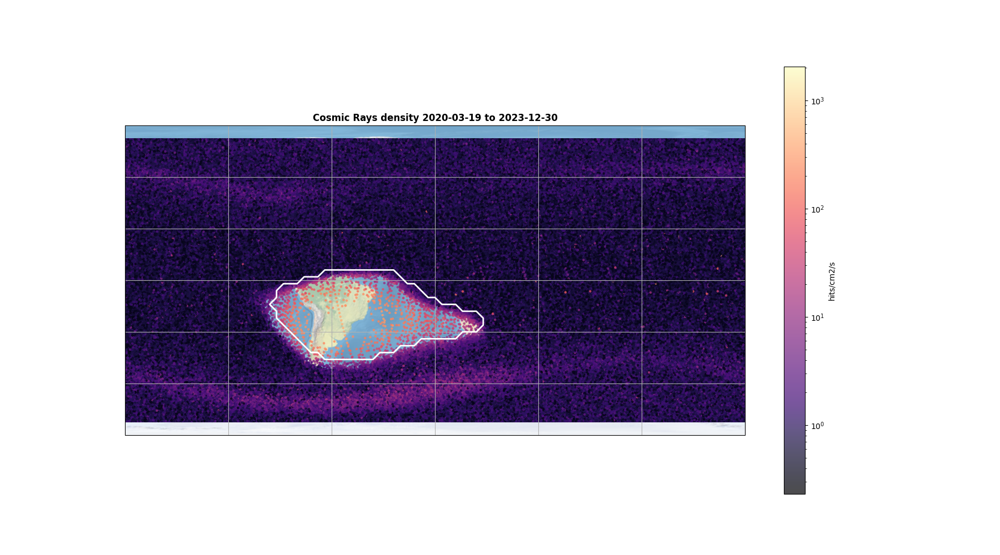

In [16]:
#%matplotlib widget
plt.close('all')
fig = plt.figure(figsize=(18, 10))
ax = plt.axes(projection=ccrs.PlateCarree())
#ax = plt.axes(projection=ccrs.Orthographic(0, -90))
ax.stock_img()
ax.gridlines()

# Plot SAA contour
plt.contour(lon[1:,1:], lat[1:,1:], SAA_masked_binned, colors = 'white', linewidths = 2, levels=[0], origin='lower', extent=(lon_min, lon_max, lat_min, lat_max),transform=ccrs.PlateCarree())

x = data_plot['LONGITUDE']
y = data_plot['LATITUDE']
c = data_plot['density_cosmics']

cr = plt.scatter(x,y,c = c, s = 5, norm=LogNorm(), alpha = 0.7, marker = 'o', cmap='magma', transform=ccrs.Geodetic())#, label = labels[i])
plt.colorbar(cr, label = 'hits/cm2/s' )

# #plt.title('June 28th, at 08:40:00, SAA_FLAG is False in MPS_PRE_VISIT')
# #plt.legend(frameon=True,bbox_to_anchor=(0.7,0),markerscale=1)
# #save_folder = '/Users/alexisheitzmann/Documents/CHEOPS/Code/SSA_mismapping/imagette_mapping/AU_Mic_5_sec_visits/'
# name_addition = 'all'
# save_name = 'map_CR_detections_'+ name_addition + '_' + np.min(full_orb_res_err.index).strftime("%Y-%m-%d") + '_to_' + np.max(full_orb_res_err.index).strftime("%Y-%m-%d") + '.png'
#title = str(len(data_plot)) + ' detections from ' + np.min(full_orb_res_err.index).strftime("%Y-%m-%d") + ' to ' + np.max(full_orb_res_err.index).strftime("%Y-%m-%d")
title = 'Cosmic Rays density ' + data_plot.time.min().strftime('%Y-%m-%d') + ' to ' + data_plot.time.max().strftime('%Y-%m-%d')
plt.title(title, weight = 'bold')
#fileout_name = "CR_density_" + data_plot.time.min().strftime('%Y-%m-%d') + "_to_" + data_plot.time.max().strftime('%Y-%m-%d')+ ".png"
#plt.savefig(output_folder / fileout_name, transparent = False, dpi = 600,format = 'png')

interactive(children=(FloatSlider(value=0.0, description='idx', max=7.0, step=1.0), Output()), _dom_classes=('…

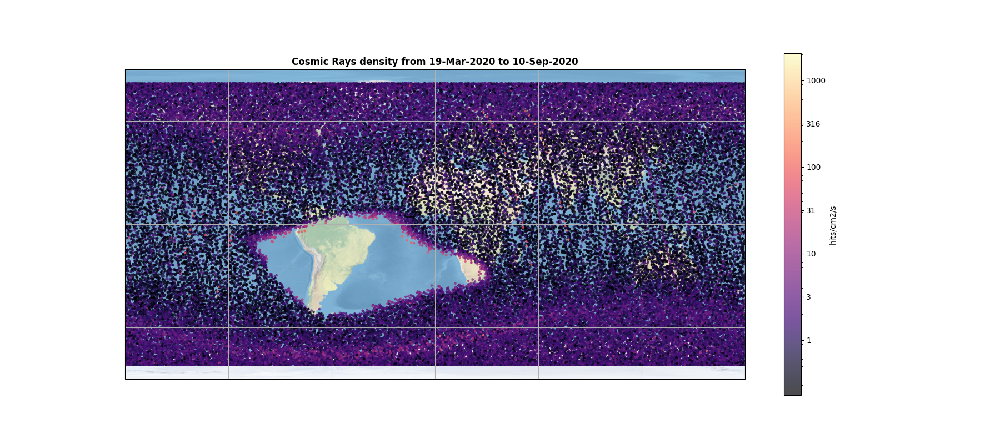

In [17]:
def update_data(idx):
    start = start_date + time_resolution*int(idx)
    end  = start_date + time_resolution*(int(idx)+1)
    data_between_dates = data_plot[(data_plot.time > start) & (data_plot.time < end)]
    
    x = data_between_dates['LONGITUDE']
    y = data_between_dates['LATITUDE']
    c = data_between_dates['density_cosmics']
    
    return start,end,x,y,c    


# Time between frames
logscale = True
time_resolution =  pd.Timedelta(weeks= 25)
nb_maps = int(np.ceil((end_date - start_date)/time_resolution))

fig = plt.figure(figsize=(18, 8))
ax = plt.axes(projection=ccrs.PlateCarree())
#ax = plt.axes(projection=ccrs.Orthographic(0, -90))
ax.stock_img()
ax.gridlines()

# Plot SAA contour
plt.contour(lon[1:,1:], lat[1:,1:], SAA_masked_binned, colors = 'white', linewidths = 2, levels=[0], origin='lower', extent=(lon_min, lon_max, lat_min, lat_max),transform=ccrs.PlateCarree())

# Plot initial data
x = data_plot['LONGITUDE']
y = data_plot['LATITUDE']
c = data_plot['density_cosmics']
   

if logscale: 
    cr = ax.scatter(x,y,c = c, s = 5, alpha = 0.7, marker = 'o', norm=LogNorm(), cmap='magma', transform=ccrs.Geodetic())#, label = labels[i])
    # Calculate the log range for the colorbar
    log_min = np.floor(np.log10(data_plot['density_cosmics'].min()+1))
    log_max = np.round(np.log10(data_plot['density_cosmics'].max()),1)
    #log_range = np.logspace(log_min, log_max, num=10)
    log_range = np.arange(log_min, log_max, 0.5)
    # Convert back from log scale to the original scale
    cbar_range = 10**log_range
    # Create a logarithmic norm for the color mapping
    log_norm = matplotlib.colors.LogNorm(vmin=10**log_min, vmax=10**log_max)
    # Create the colorbar with logarithmic ticks
    colorbar = fig.colorbar(cr, ax=ax, label='hits/cm2/s', ticks=cbar_range, norm=log_norm)
    colorbar.set_ticks(cbar_range)
    colorbar.set_ticklabels([f'{int(tick)}' for tick in cbar_range])

else: 
    cr = ax.scatter(x,y,c = c, s = 5, alpha = 0.7, marker = 'o', cmap='magma', transform=ccrs.Geodetic())#, label = labels[i])
    colorbar = fig.colorbar(cr, ax=ax, label = 'hits/cm2/s')#, ticks=cbar_range)


def plotimg(idx):
    
    ax.clear()
    ax.stock_img()
    ax.gridlines()
    # start = start_date + time_resolution*int(idx)
    # end  = start_date + time_resolution*(int(idx)+1)
    # data_between_dates = data_plot[(data_plot.time > start) & (data_plot.time < end)]
    
    # x = data_between_dates['LONGITUDE']
    # y = data_between_dates['LATITUDE']
    # c = data_between_dates['density_cosmics']
    start,end, x,y,c = update_data(idx)
    if logscale:
        cr = ax.scatter(x,y,c = c, s = 5, alpha = 0.7, norm=LogNorm(), marker = 'o', cmap='magma', transform=ccrs.Geodetic())#, label = labels[i])
    else:
        cr = ax.scatter(x,y,c = c, s = 5, alpha = 0.7, marker = 'o', cmap='magma', transform=ccrs.Geodetic())#, label = labels[i]
    ax.set_title('Cosmic Rays density from ' + start.strftime('%d-%b-%Y') + ' to ' + end.strftime('%d-%b-%Y'), weight = 'bold')

ipywidgets.interact(plotimg, idx = ipywidgets.FloatSlider(value=0,min=0,max=nb_maps-1,step=1))
plt.show()

# BIN

Text(0.5, 1.0, 'Cosmic Rays density 2020-03-19 to 2023-12-30')

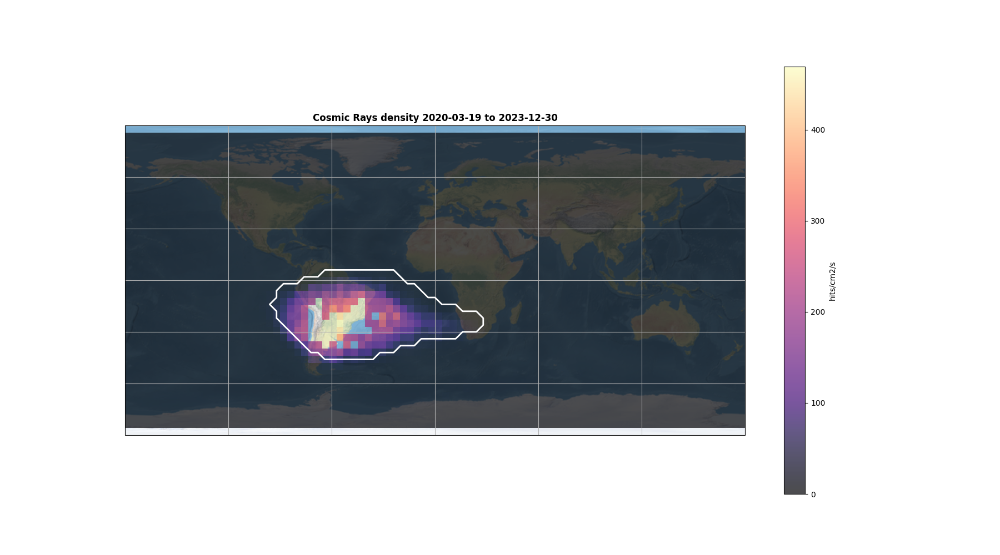

In [18]:
plt.close('all')
fig = plt.figure(figsize=(18, 10))
ax = plt.axes(projection=ccrs.PlateCarree())
#ax = plt.axes(projection=ccrs.Orthographic(0, -90))
ax.stock_img()
ax.gridlines()

# Plot SAA contour
plt.contour(lon[1:,1:], lat[1:,1:], SAA_masked_binned, colors = 'white', linewidths = 2, levels=[0], origin='lower', extent=(lon_min, lon_max, lat_min, lat_max),transform=ccrs.PlateCarree())

x = data_plot['LONGITUDE']
y = data_plot['LATITUDE']
c = data_plot['density_cosmics']

bin_size = 4
x_bins = np.arange(lon_min+bin_size, lon_max, bin_size)
y_bins = np.arange(lat_min+bin_size, lat_max, bin_size)

ret = binned_statistic_2d(x, y, c, statistic='median', bins=[x_bins, y_bins])
# SAA_map_plot = ax.imshow(ret.statistic.T, origin='lower', alpha = 0.7, norm=LogNorm(), cmap = 'magma', extent=(lon_min, lon_max, lat_min, lat_max), interpolation='nearest')#,transform=ccrs.PlateCarree()) # Supported values for interplotation are 'none', 'antialiased', 'nearest', 'bilinear', 'bicubic', 'spline16', 'spline36', 'hanning', 'hamming', 'hermite', 'kaiser', 'quadric', 'catrom', 'gaussian', 'bessel', 'mitchell', 'sinc', 'lanczos', 'blackman'.
SAA_map_plot = ax.imshow(ret.statistic.T, origin='lower', alpha = 0.7, cmap = 'magma', extent=(lon_min, lon_max, lat_min, lat_max), interpolation='nearest')#,transform=ccrs.PlateCarree()) # Supported values for interplotation are 'none', 'antialiased', 'nearest', 'bilinear', 'bicubic', 'spline16', 'spline36', 'hanning', 'hamming', 'hermite', 'kaiser', 'quadric', 'catrom', 'gaussian', 'bessel', 'mitchell', 'sinc', 'lanczos', 'blackman'.
plt.colorbar(SAA_map_plot, label = 'hits/cm2/s' )

# save_name = 'map_CR_detections_'+ name_addition + '_' + np.min(full_orb_res_err.index).strftime("%Y-%m-%d") + '_to_' + np.max(full_orb_res_err.index).strftime("%Y-%m-%d") + '.png'
#title = str(len(data_plot)) + ' detections from ' + np.min(full_orb_res_err.index).strftime("%Y-%m-%d") + ' to ' + np.max(full_orb_res_err.index).strftime("%Y-%m-%d")


title = 'Cosmic Rays density ' + data_plot.time.min().strftime('%Y-%m-%d') + ' to ' + data_plot.time.max().strftime('%Y-%m-%d')
plt.title(title, weight = 'bold')
#fileout_name = "CR_density_binned_" + data_plot.time.min().strftime('%Y-%m-%d') + "_to_" + data_plot.time.max().strftime('%Y-%m-%d')+ "_log_scale.png"
#plt.savefig(output_folder / fileout_name, transparent = False, dpi = 600,format = 'png')

# OTHER Plots


In [19]:
# Linear values
statistic, x_edge, y_edge, _ = binned_statistic_2d(x, y, c, statistic='median', bins=[x_bins, y_bins])

The following Longitudes were not plotted as the max hits/cm2/sec < 200:
[-174.0, -170.0, -166.0, -162.0, -158.0, -154.0, -150.0, -146.0, -142.0, -138.0, -134.0, -130.0, -126.0, -122.0, -118.0, -114.0, -110.0, -106.0, -102.0, -98.0, 26.0, 30.0, 34.0, 38.0, 42.0, 46.0, 50.0, 54.0, 58.0, 62.0, 66.0, 70.0, 74.0, 78.0, 82.0, 86.0, 90.0, 94.0, 98.0, 102.0, 106.0, 110.0, 114.0, 118.0, 122.0, 126.0, 130.0, 134.0, 138.0, 142.0, 146.0, 150.0, 154.0, 158.0, 162.0, 166.0, 170.0, 174.0]


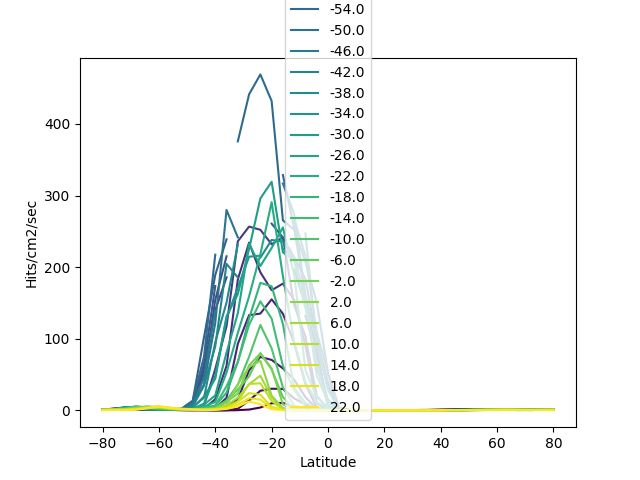

In [23]:
longitudes = ret.x_edge + bin_size/2 # take the middle of the bins
latitudes = ret.y_edge + bin_size/2 # take the middle of the bins
non_plotted_lon = []
min_hits = 200

plt.close('all')
# Define the number of plots
num_plots = 30
colormap = plt.cm.viridis
colors = colormap(np.linspace(0, 1, num_plots))

plt.figure()
c_i = 0
for i in range(len(longitudes)-1):
    in_SAA = np.where(SAA_masked_binned.T[i,:] > 0)[0]
    if len(in_SAA) == 0:
        non_plotted_lon.append(longitudes[i])
        continue
    plt.plot(latitudes[:-1], statistic[i,:], color = colors[c_i], label = longitudes[i])
    #plt.yscale('log')
    c_i += 1
plt.legend(title = 'Longitude')
plt.xlabel("Latitude")
plt.ylabel("Hits/cm2/sec")
print(f"The following Longitudes were not plotted as the max hits/cm2/sec < {min_hits}:")
print(non_plotted_lon)

plt.show()


The following Longitudes were not plotted as the max hits/cm2/sec < 200:
[-174.0, -170.0, -166.0, -162.0, -158.0, -154.0, -150.0, -146.0, -142.0, -138.0, -134.0, -130.0, -126.0, -122.0, -118.0, -114.0, -110.0, -106.0, -102.0, -98.0, 26.0, 30.0, 34.0, 38.0, 42.0, 46.0, 50.0, 54.0, 58.0, 62.0, 66.0, 70.0, 74.0, 78.0, 82.0, 86.0, 90.0, 94.0, 98.0, 102.0, 106.0, 110.0, 114.0, 118.0, 122.0, 126.0, 130.0, 134.0, 138.0, 142.0, 146.0, 150.0, 154.0, 158.0, 162.0, 166.0, 170.0, 174.0, -174.0, -170.0, -166.0, -162.0, -158.0, -154.0, -150.0, -146.0, -142.0, -138.0, -134.0, -130.0, -126.0, -122.0, -118.0, -114.0, -110.0, -106.0, -102.0, -98.0, 26.0, 30.0, 34.0, 38.0, 42.0, 46.0, 50.0, 54.0, 58.0, 62.0, 66.0, 70.0, 74.0, 78.0, 82.0, 86.0, 90.0, 94.0, 98.0, 102.0, 106.0, 110.0, 114.0, 118.0, 122.0, 126.0, 130.0, 134.0, 138.0, 142.0, 146.0, 150.0, 154.0, 158.0, 162.0, 166.0, 170.0, 174.0]


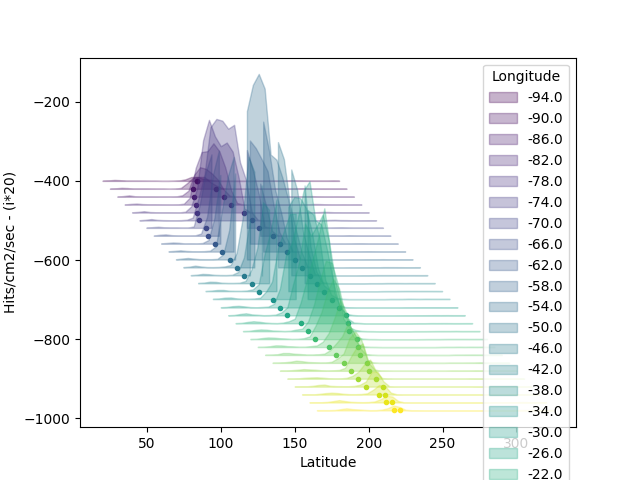

In [24]:

shift_factor_y = 20
shift_factor_x = 5
plt.close('all')
plt.figure()
c_i = 0
for i in range(len(longitudes)-1):
    in_SAA = np.where(SAA_masked_binned.T[i,:] > 0)[0]
    if len(in_SAA) == 0:
        non_plotted_lon.append(longitudes[i])
        continue
    #plt.plot(latitudes[:-1], statistic[i,:]- i*shift_factor, color = colors[c_i], label = longitudes[i])
    y1 = np.zeros(shape= np.shape(statistic[i,:]))- i*shift_factor_y
    y2 = statistic[i,:]- i*shift_factor_y
    plt.fill_between(latitudes[:-1]+shift_factor_x*i, y1, y2, where=(y2>=y1), color = colors[c_i], label = longitudes[i], alpha = 0.3)
    ind_lat_min_SAA = in_SAA[0]
    ind_lat_max_SAA = in_SAA[-1]
    #plt.plot(latitudes[ind_lat_min_SAA], statistic[i,ind_lat_min_SAA]-i*shift_factor, 'o', color = colors[c_i])
    #plt.plot(latitudes[ind_lat_max_SAA],statistic[i,ind_lat_max_SAA]-i*shift_factor, 'o', color = colors[c_i])
    plt.plot(latitudes[ind_lat_min_SAA]+shift_factor_x*i, -i*shift_factor_y, '.', color = colors[c_i], zorder = 0)
    plt.plot(latitudes[ind_lat_max_SAA]+shift_factor_x*i,-i*shift_factor_y, '.', color = colors[c_i], zorder = 0)
    c_i += 1
plt.legend(title = 'Longitude')

print(f"The following Longitudes were not plotted as the max hits/cm2/sec < {min_hits}:")
print(non_plotted_lon)
plt.xlabel("Latitude")
plt.ylabel(f"Hits/cm2/sec - (i*{shift_factor_y})")
plt.show()


/tmp/ipykernel_5635/2976992728.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


The following Longitudes were not plotted as the max hits/cm2/sec < 200:
[-174.0, -170.0, -166.0, -162.0, -158.0, -154.0, -150.0, -146.0, -142.0, -138.0, -134.0, -130.0, -126.0, -122.0, -118.0, -114.0, -110.0, -106.0, -102.0, -98.0, 26.0, 30.0, 34.0, 38.0, 42.0, 46.0, 50.0, 54.0, 58.0, 62.0, 66.0, 70.0, 74.0, 78.0, 82.0, 86.0, 90.0, 94.0, 98.0, 102.0, 106.0, 110.0, 114.0, 118.0, 122.0, 126.0, 130.0, 134.0, 138.0, 142.0, 146.0, 150.0, 154.0, 158.0, 162.0, 166.0, 170.0, 174.0, -174.0, -170.0, -166.0, -162.0, -158.0, -154.0, -150.0, -146.0, -142.0, -138.0, -134.0, -130.0, -126.0, -122.0, -118.0, -114.0, -110.0, -106.0, -102.0, -98.0, 26.0, 30.0, 34.0, 38.0, 42.0, 46.0, 50.0, 54.0, 58.0, 62.0, 66.0, 70.0, 74.0, 78.0, 82.0, 86.0, 90.0, 94.0, 98.0, 102.0, 106.0, 110.0, 114.0, 118.0, 122.0, 126.0, 130.0, 134.0, 138.0, 142.0, 146.0, 150.0, 154.0, 158.0, 162.0, 166.0, 170.0, 174.0, -174.0, -170.0, -166.0, -162.0, -158.0, -154.0, -150.0, -146.0, -142.0, -138.0, -134.0, -130.0, -126.0, -122.0, -1

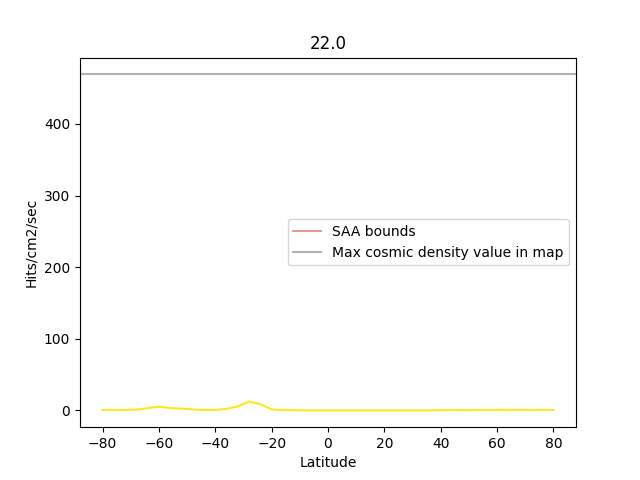

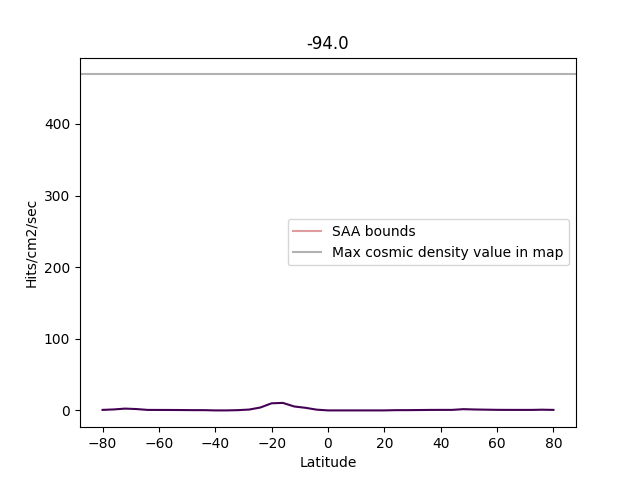

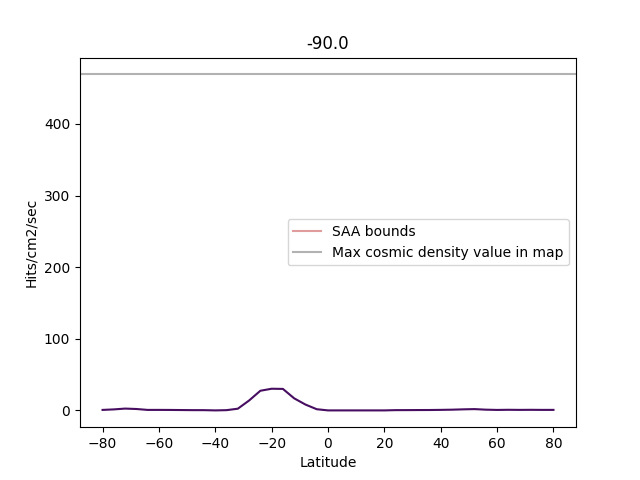

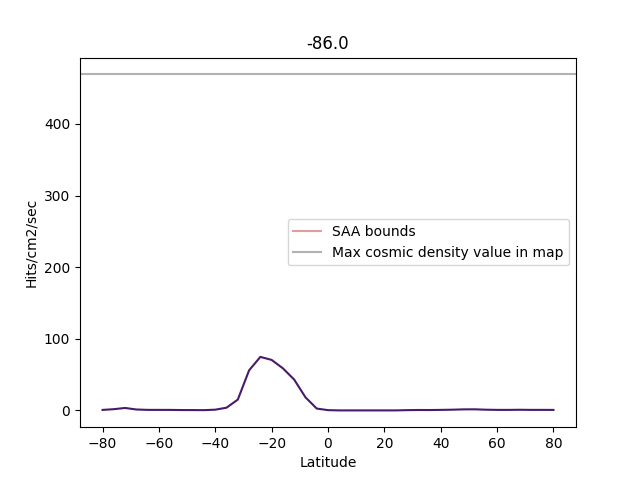

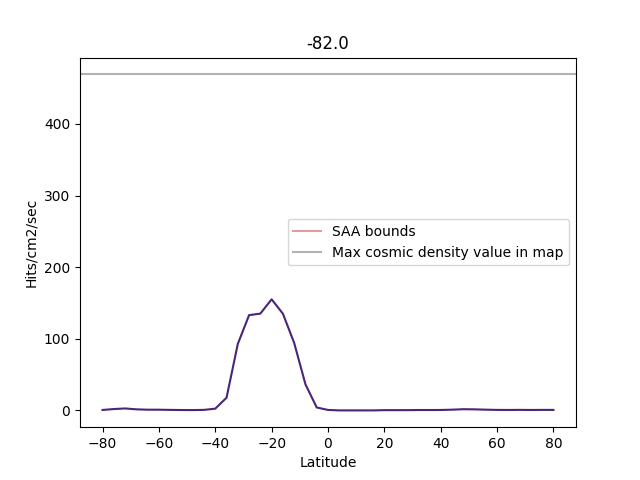

...

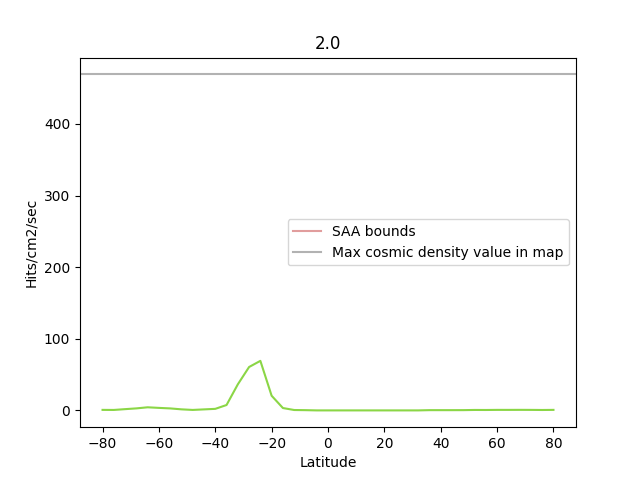

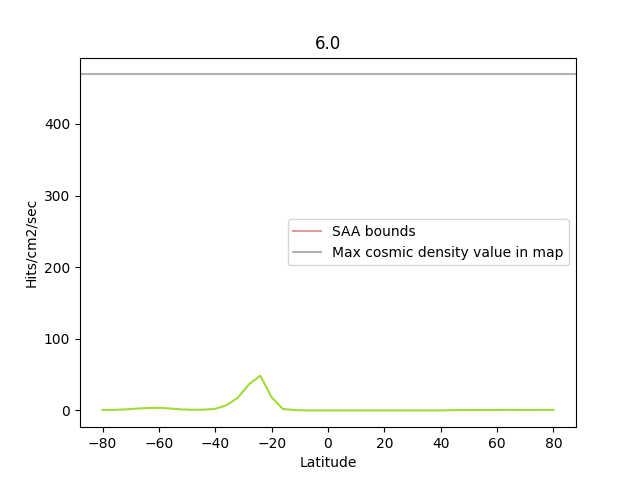

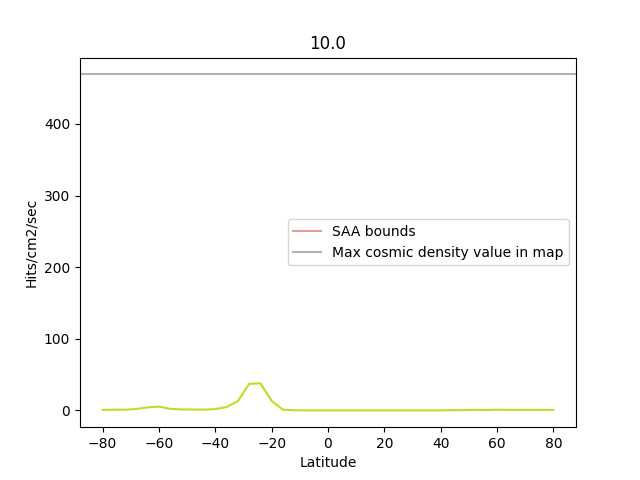

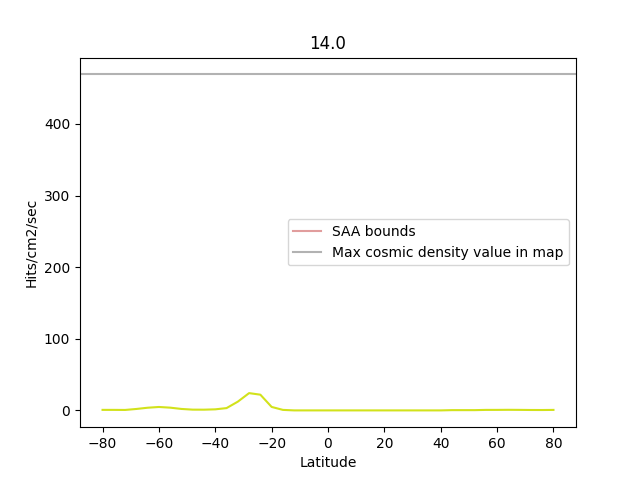

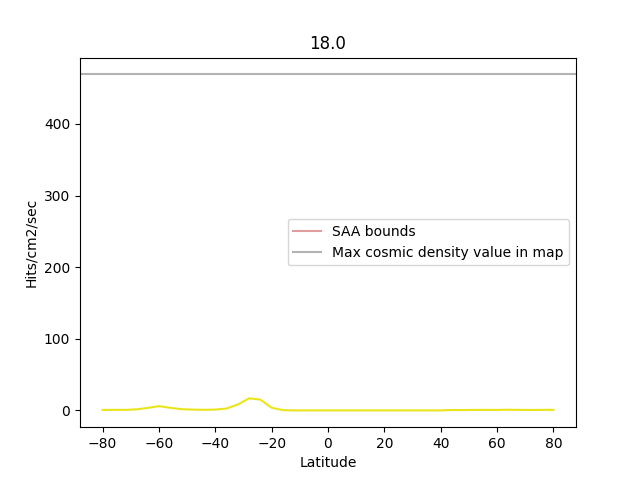

In [25]:
max_density = np.nanmax(statistic[:,:])

plt.close('all')
c_i = 0
for i in range(len(longitudes)-1):
    in_SAA = np.where(SAA_masked_binned.T[i,:] > 0)[0]
    if len(in_SAA) == 0:
        non_plotted_lon.append(longitudes[i])
        continue
    plt.figure()
    plt.plot(latitudes[:-1], statistic[i,:], color = colors[c_i])
    plt.axvline(latitudes[in_SAA[0]],0,statistic[i,:].max(), color = 'indianred',alpha = 0.6, label = 'SAA bounds')
    plt.axvline(latitudes[in_SAA[-1]],0,statistic[i,:].max(), color = 'indianred',alpha = 0.6)
    plt.axhline(max_density,latitudes[0],latitudes[-1], color = 'grey', alpha = 0.6, label = 'Max cosmic density value in map')
    plt.title(longitudes[i])
    c_i += 1
    plt.xlabel("Latitude") 
    plt.ylabel(f"Hits/cm2/sec")
    plt.legend()

print(f"The following Longitudes were not plotted as the max hits/cm2/sec < {min_hits}:")
print(non_plotted_lon)
plt.show()

## CME data

In [55]:
# get the cme data
cme_path = "solar_data/CME_data_LASCO_SOHO_v6.txt"
cme_file = Path(cme_path)

cme_data = pd.read_csv(cme_file, delimiter='|')#, usecols=[0,1])
print(cme_data)

      # CME            t0       dt0   pa    da     v      dv    minv   maxv  \
0          1      2020-01/07      2   281     8    112     18    105    143   
1          2      2020-01/18      1    92     6    358    449    260   1250   
2          3      2020-01/19      2    77    12    105      2    102    109   
3          4      2020-01/22      1   267    16    171     35    117    188   
4          5      2020-01/29      4    81    36    161     35    104    244   
...      ...              ...   ...   ...   ...    ...    ...    ...    ...   
6112      36      2024-09/08      1   282    50    455     50    422    569   
6113      37      2024-09/08      2     1    36    359     60    231    457   
6114      38      2024-09/09     10   144   360    867    502    243   1953   
6115      39      2024-09/09      1    86    26    446     77    258    496   
6116      40      2024-09/09      5    11    76    288     50    167    390   

      halo?  
0            
1            
2        

## Kp Index

In [44]:
# daily Kp Index
from getKpindex import getKpindex

(time, index, status) = getKpindex('2020-03-01', '2024-09-10','Kp')

index = np.array(index)
kpIndex = index.reshape(-1,8).mean(axis=1)

def remove_duplicates(list):
    return [list[i] for i in range(len(list)) if i==0 or list[i] != list[i-1]]

dates = []

for i in time:
    dates.append(i.rsplit('T', 1)[0])
dates = remove_duplicates(dates)

kp_dict = {'date': pd.to_datetime(dates), 'kpIndex': kpIndex}
kp_df = pd.DataFrame(kp_dict)

print(kp_df)

           date   kpIndex
0    2020-03-01  1.375000
1    2020-03-02  1.000000
2    2020-03-03  1.416750
3    2020-03-04  1.416625
4    2020-03-05  0.791875
...         ...       ...
1650 2024-09-06  1.291625
1651 2024-09-07  1.500000
1652 2024-09-08  1.916625
1653 2024-09-09  1.833125
1654 2024-09-10  1.625125

[1655 rows x 2 columns]


In [36]:
# get different bins for the kp index

#monthly
kp_month = kp_df.groupby(pd.PeriodIndex(kp_df['date'], freq='M'))['kpIndex'].mean().reset_index()
kp_month['date'] = pd.to_datetime(kp_month['date'].astype(str) + '-01')

#weekly
kp_week = kp_df.groupby(pd.PeriodIndex(kp_df['date'], freq='W'))['kpIndex'].mean().reset_index()
kp_week['date'] = kp_week['date'].dt.to_timestamp()


          date   kpIndex
0   2020-02-24  1.375000
1   2020-03-02  1.101232
2   2020-03-09  1.029804
3   2020-03-16  1.589286
4   2020-03-23  1.303518
..         ...       ...
233 2024-08-12  2.815446
234 2024-08-19  1.851214
235 2024-08-26  2.464304
236 2024-09-02  1.559536
237 2024-09-09  1.729125

[238 rows x 2 columns]


## Ap Index

In [43]:
(time, index, status) = getKpindex('2020-03-01', '2024-09-10','Ap')

ApIndex = np.array(index)

Ap_dict = {'date': pd.to_datetime(dates), 'ApIndex': ApIndex}
Ap_df = pd.DataFrame(Ap_dict)

print(Ap_df)

{"meta":{"source":"GFZ Potsdam","license":"CC BY 4.0"},"datetime":["2020-03-01T00:00:00Z","2020-03-02T00:00:00Z","2020-03-03T00:00:00Z","2020-03-04T00:00:00Z","2020-03-05T00:00:00Z","2020-03-06T00:00:00Z","2020-03-07T00:00:00Z","2020-03-08T00:00:00Z","2020-03-09T00:00:00Z","2020-03-10T00:00:00Z","2020-03-11T00:00:00Z","2020-03-12T00:00:00Z","2020-03-13T00:00:00Z","2020-03-14T00:00:00Z","2020-03-15T00:00:00Z","2020-03-16T00:00:00Z","2020-03-17T00:00:00Z","2020-03-18T00:00:00Z","2020-03-19T00:00:00Z","2020-03-20T00:00:00Z","2020-03-21T00:00:00Z","2020-03-22T00:00:00Z","2020-03-23T00:00:00Z","2020-03-24T00:00:00Z","2020-03-25T00:00:00Z","2020-03-26T00:00:00Z","2020-03-27T00:00:00Z","2020-03-28T00:00:00Z","2020-03-29T00:00:00Z","2020-03-30T00:00:00Z","2020-03-31T00:00:00Z","2020-04-01T00:00:00Z","2020-04-02T00:00:00Z","2020-04-03T00:00:00Z","2020-04-04T00:00:00Z","2020-04-05T00:00:00Z","2020-04-06T00:00:00Z","2020-04-07T00:00:00Z","2020-04-08T00:00:00Z","2020-04-09T00:00:00Z","2020-04-10T0

In [45]:
# get different bins for the Ap index

#monthly
Ap_month = Ap_df.groupby(pd.PeriodIndex(Ap_df['date'], freq='M'))['ApIndex'].mean().reset_index()
Ap_month['date'] = pd.to_datetime(Ap_month['date'].astype(str) + '-01')

#weekly
Ap_week = Ap_df.groupby(pd.PeriodIndex(Ap_df['date'], freq='W'))['ApIndex'].mean().reset_index()
Ap_week['date'] = Ap_week['date'].dt.to_timestamp()


## Sunspot Number

In [50]:
(time, index, status) = getKpindex('2020-03-01', '2024-09-10','SN')

SN = np.array(index)

SN_dict = {'date': pd.to_datetime(dates), 'Sunspot Number': SN}
SN_df = pd.DataFrame(SN_dict)

print(SN_df)

{"meta":{"source":"GFZ Potsdam","license":"CC BY 4.0"},"datetime":["2020-03-01T00:00:00Z","2020-03-02T00:00:00Z","2020-03-03T00:00:00Z","2020-03-04T00:00:00Z","2020-03-05T00:00:00Z","2020-03-06T00:00:00Z","2020-03-07T00:00:00Z","2020-03-08T00:00:00Z","2020-03-09T00:00:00Z","2020-03-10T00:00:00Z","2020-03-11T00:00:00Z","2020-03-12T00:00:00Z","2020-03-13T00:00:00Z","2020-03-14T00:00:00Z","2020-03-15T00:00:00Z","2020-03-16T00:00:00Z","2020-03-17T00:00:00Z","2020-03-18T00:00:00Z","2020-03-19T00:00:00Z","2020-03-20T00:00:00Z","2020-03-21T00:00:00Z","2020-03-22T00:00:00Z","2020-03-23T00:00:00Z","2020-03-24T00:00:00Z","2020-03-25T00:00:00Z","2020-03-26T00:00:00Z","2020-03-27T00:00:00Z","2020-03-28T00:00:00Z","2020-03-29T00:00:00Z","2020-03-30T00:00:00Z","2020-03-31T00:00:00Z","2020-04-01T00:00:00Z","2020-04-02T00:00:00Z","2020-04-03T00:00:00Z","2020-04-04T00:00:00Z","2020-04-05T00:00:00Z","2020-04-06T00:00:00Z","2020-04-07T00:00:00Z","2020-04-08T00:00:00Z","2020-04-09T00:00:00Z","2020-04-10T0

In [51]:
# get different bins for the Ap index

#monthly
SN_month = SN_df.groupby(pd.PeriodIndex(SN_df['date'], freq='M'))['Sunspot Number'].mean().reset_index()
SN_month['date'] = pd.to_datetime(SN_month['date'].astype(str) + '-01')

#weekly
SN_week = SN_df.groupby(pd.PeriodIndex(SN_df['date'], freq='W'))['Sunspot Number'].mean().reset_index()
SN_week['date'] = SN_week['date'].dt.to_timestamp()


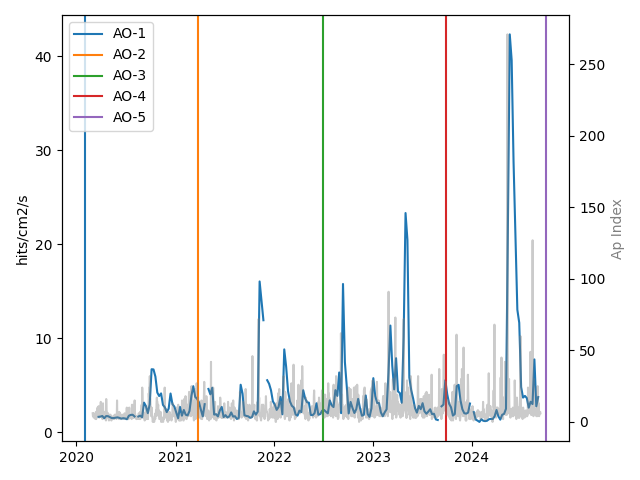

In [54]:
start_AO1 = pd.Timestamp("2020-02-01 12:00:00", tz = 'UTC')
start_AO2 = pd.Timestamp("2021-03-26 12:00:00", tz = 'UTC')
start_AO3 = pd.Timestamp("2022-07-01 12:00:00", tz = 'UTC')
start_AO4 = pd.Timestamp("2023-09-25 12:00:00", tz = 'UTC')
start_AO5 = pd.Timestamp("2024-10-01 12:00:00", tz = 'UTC')


plt.close('all')

# Read the CSV file into a DataFrame

df = pd.read_csv('1week.csv', delimiter=',')
time = pd.to_datetime(df['Timestamp'])
time_cme = pd.to_datetime(cme_data['          t0    '])
time_kpIndex = kp_week['date']
time_ApIndex = Ap_df['date']
time_sunspots = SN_week['date']
mean_density_cosmics = pd.to_numeric(df['Data'])
cmes = cme_data['# CME ']
kp_index = kp_week['kpIndex']
Ap_index = Ap_df['ApIndex']
number_sunspots = SN_week['Sunspot Number']

fig, ax1 = plt.subplots()

ax1.set_ylabel('hits/cm2/s')
#ax1.set_xticks(rotation=45)
ax1.plot(time,mean_density_cosmics)
ax1.axvline(start_AO1, c='C0', label = 'AO-1')
ax1.axvline(start_AO2, c='C1', label = 'AO-2')
ax1.axvline(start_AO3, c='C2',label = 'AO-3')
ax1.axvline(start_AO4, c='C3', label = 'AO-4')
ax1.axvline(start_AO5, c='C4',label = 'AO-5')

ax2 = ax1.twinx()

color = 'tab:grey'
ax2.set_ylabel('Ap Index', color='grey')
ax2.plot(time_ApIndex, Ap_index, color=color, zorder=-1, alpha=0.4, label='Ap index')\

#plt.figure()
#plt.plot(time,mean_density_cosmics)
#plt.bar(time_cme,cmes, color='goldenrod', label='# CMEs')
#plt.xticks(rotation=45)
#plt.axvline(start_AO1, c='C0', label = 'AO-1')
#plt.axvline(start_AO2, c='C1', label = 'AO-2')
#plt.axvline(start_AO3, c='C2',label = 'AO-3')
#plt.axvline(start_AO4, c='C3', label = 'AO-4')
#plt.axvline(start_AO5, c='C4',label = 'AO-5')
#plt.ylabel('hits/cm2/s')
ax1.legend()
#ax2.legend()
fig.tight_layout()

# Look at Energies

In [7]:
new_data = all_data.drop(all_data[all_data['nb_cosmics'] == 0].index)

nb_cosmics = new_data['nb_cosmics']
density_cosmics = new_data['density_cosmics']
loc_cosmics = list(new_data['pix_cosmics'])
centroid_cosmics = new_data['centroid_cosmics']
raw_images_with_cosmics = new_data['raw_images']

In [10]:
def check_positions(positions):
   coordinates_index = []
   for i in range(len(positions)):
      this_visit = i
      for j in range(len(positions[i])):
         for k in range(len(positions[i][j])):
               this_element = positions[i][j][k]
               this_element_index = {j,k}
               counter = 0

               if this_element != 0:
                  # check right
                  if k < len(positions[i][j])-1:
                     if positions[i][j][k+1] != 0:
                        counter += 1
                     
                  # check left
                  if k > 0:
                     if positions[i][j][k-1] != 0:
                        counter += 1

                  # check upper
                  if j > 0:
                     if positions[i][j-1][k] != 0:
                        counter += 1
                     
                  # check lower
                  if j < len(positions[i])-1:
                     if positions[i][j+1][k]:
                        counter += 1
                     
                  # check upper right
                  if j > 0 and k < len(positions[i][j])-1:
                     if positions[i][j-1][k+1]:
                        counter += 1
                     
                  # check upper left
                  if j > 0 and k > 0:
                     if positions[i][j-1][k-1]:
                        counter += 1
                     
                  # check lower right
                  if j < len(positions[i])-1 and k < len(positions[i][j])-1:
                     if positions[i][j+1][k+1]:
                        counter += 1
                     
                  # check lower left
                  if j < len(positions[i])-1 and k > 0:
                     if positions[i][j+1][k-1]:
                        counter += 1

               if counter > 0:
                  coordinates_index.append(this_element_index)
                  coordinates_index.append("visit %s" %this_visit)
   return coordinates_index
                                              
                     
positions = check_positions(loc_cosmics)

with open('positions.txt', 'w') as file:
   for item in positions:
      file.write("%s\n" %item)